### West Virginia

BYM and BYM-TDA 

In [1]:
import os

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
import matplotlib.pyplot as plt


from scipy import sparse
from scipy.linalg import solve
from scipy.sparse.linalg import spsolve

import geopandas as gpd

# these libraries are not dependencies of pymc

import networkx as nx
import nutpie
import libpysal as ps

In [2]:
RANDOM_SEED = 8926
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")

In [3]:
current_path = os.getcwd()

In [4]:
state_abb = "VA"
state_abb_lower = state_abb.lower()

Load the data

In [5]:
# SVI
svi_tda_data = pd.read_csv(os.path.join(current_path, "data", "processed_data", f"tda_summaries_2018_{state_abb}_down.csv"), dtype={'STCNTY': str})

# SMR
smr_data = pd.read_csv(os.path.join(current_path, "data", "processed_data", f"smr_data_2018_{state_abb}.csv"), dtype={'FIPS': str})

# GEO: get geometry data
geo_data = gpd.read_file(os.path.join(current_path, "data", "raw_data", "SVI2018_US_county.gdb"), dtype={"FIPS": str})

geo_data = geo_data[['FIPS', 'geometry','ST_ABBR']]

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/pyogrio/raw.py:198: RuntimeWarning: driver OpenFileGDB does not support open option DTYPE
  return ogr_read(


In [6]:
# combine smr on FIPS and svi data on STCNTY - left
combined_data = pd.merge(smr_data, svi_tda_data, left_on="FIPS", right_on="STCNTY", how="left")

# merge combined data with geo data
combined_data = pd.merge(combined_data, geo_data, on="FIPS", how="left")

In [7]:
# print the shape
print(f"Shape of the combined data: {combined_data.shape}")

Shape of the combined data: (133, 89)


In [8]:
# get the 'state' data

combined_data = combined_data[combined_data['ST_ABBR'] == state_abb]

In [9]:
combined_data.shape

(133, 89)

In [10]:
# Adding this just to plot original data!
# Replace 0 with NaN in observed_deaths column
combined_data_map = combined_data.copy()
combined_data_map["observed_deaths"] = combined_data_map["observed_deaths"].replace(0.0, np.nan)

gdf_map = gpd.GeoDataFrame(combined_data_map, geometry='geometry')

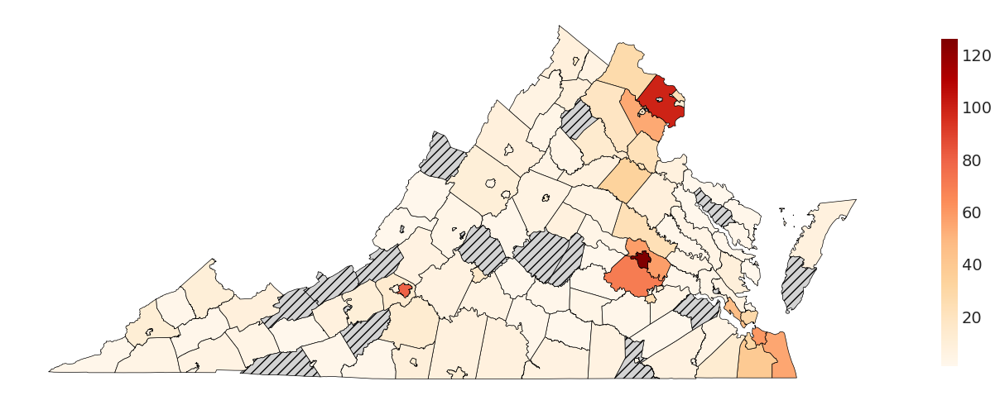

In [11]:
import matplotlib.pyplot as plt
import geopandas as gpd

# plot a map with observed death counts
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

gdf_map.plot(
    column="observed_deaths", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"observed_deaths.png"), bbox_inches='tight', dpi=300)

Cleaning the data: Removing the rows with missing observed deaths, islands, few states

In [12]:
# filter by column to have columns start with EP_ or SMR and geometry and FIPS and observed_death and expected_death
combined_data = combined_data.filter(regex='EP_|SMR|geometry|FIPS|observed_death|expected_death')

# drop the rows with observed_death = 0
combined_data = combined_data[combined_data['observed_deaths'] > 0]

# make it a geodataframe
gdf = gpd.GeoDataFrame(combined_data, geometry='geometry')

# Compute Queen adjacency
w = ps.weights.Queen.from_dataframe(combined_data, ids=combined_data["FIPS"])

# if we keep the islands it will cause error in the adjacency computation(empty adjacencies)
# Get the islands fips to a list
islands = w.islands

# drop the islands
combined_data = combined_data[~combined_data["FIPS"].isin(islands)]

# drop rows with FIPS starts with 72, 78, 02, 15, 60
combined_data = combined_data[~combined_data['FIPS'].str.startswith(('72', '78', '02', '15', '60'))]

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
 There are 2 islands with ids: 51001, 51595.
  W.__init__(self, neighbors, ids=ids, **kw)


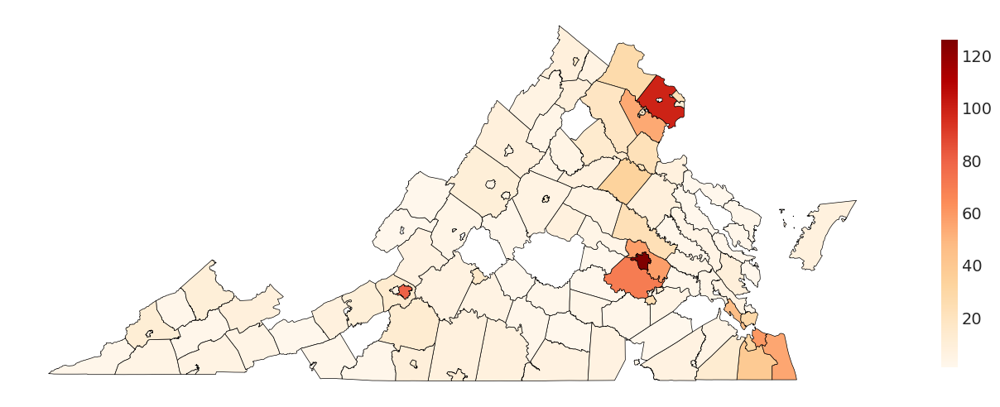

In [13]:
# plot a map with observed death counts
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

gdf.plot(
    column="observed_deaths", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.show()

Combine TDA summaries for each state(all variables)

In [14]:
# get the column names with _AL
al_cols = combined_data.filter(regex='_AL').columns

print(f"Columns with _AL: {al_cols}")

# sum the columns with _AL
combined_data['AL'] = combined_data[al_cols].sum(axis=1)

# drop the columns with _AL
# combined_data.drop(columns=al_cols, inplace=True)

# get the column names with _TL

tl_cols = combined_data.filter(regex='_TL').columns

print(f"Columns with _TL: {tl_cols}")

# sum the columns with _TL
combined_data['TL'] = combined_data[tl_cols].sum(axis=1)

# drop the columns with _TL
# combined_data.drop(columns=tl_cols, inplace=True)

# get the column names with _AML
aml_cols = combined_data.filter(regex='_AML').columns

print(f"Columns with _AML: {aml_cols}")

# sum the columns with _AML
combined_data['AML'] = combined_data[aml_cols].sum(axis=1)

# drop the columns with _AML
# combined_data.drop(columns=aml_cols, inplace=True)

# get the column names with _TML
tml_cols = combined_data.filter(regex='_TML').columns

print(f"Columns with _TML: {tml_cols}")

# sum the columns with _TML
combined_data['TML'] = combined_data[tml_cols].sum(axis=1)

# drop the columns with _TML
# combined_data.drop(columns=tml_cols, inplace=True)

Columns with _AL: Index(['EP_POV_AL', 'EP_UNEMP_AL', 'EP_PCI_AL', 'EP_NOHSDP_AL',
       'EP_UNINSUR_AL', 'EP_AGE65_AL', 'EP_AGE17_AL', 'EP_DISABL_AL',
       'EP_SNGPNT_AL', 'EP_LIMENG_AL', 'EP_MINRTY_AL', 'EP_MUNIT_AL',
       'EP_MOBILE_AL', 'EP_CROWD_AL', 'EP_NOVEH_AL', 'EP_GROUPQ_AL'],
      dtype='object')
Columns with _TL: Index(['EP_POV_TL', 'EP_UNEMP_TL', 'EP_PCI_TL', 'EP_NOHSDP_TL',
       'EP_UNINSUR_TL', 'EP_AGE65_TL', 'EP_AGE17_TL', 'EP_DISABL_TL',
       'EP_SNGPNT_TL', 'EP_LIMENG_TL', 'EP_MINRTY_TL', 'EP_MUNIT_TL',
       'EP_MOBILE_TL', 'EP_CROWD_TL', 'EP_NOVEH_TL', 'EP_GROUPQ_TL'],
      dtype='object')
Columns with _AML: Index(['EP_POV_AML', 'EP_UNEMP_AML', 'EP_PCI_AML', 'EP_NOHSDP_AML',
       'EP_UNINSUR_AML', 'EP_AGE65_AML', 'EP_AGE17_AML', 'EP_DISABL_AML',
       'EP_SNGPNT_AML', 'EP_LIMENG_AML', 'EP_MINRTY_AML', 'EP_MUNIT_AML',
       'EP_MOBILE_AML', 'EP_CROWD_AML', 'EP_NOVEH_AML', 'EP_GROUPQ_AML'],
      dtype='object')
Columns with _TML: Index(['EP_POV_TML', '

Get the adjacency matrix

In [15]:
# create the queen adjacency matrix
w = ps.weights.Queen.from_dataframe(combined_data, ids=combined_data["FIPS"])

# Spatial adjacency matrix (N x N) with binary entries for neighbor relationships.
# make it into a matrix
W = w.full()[0]

Prepare data and adjacency structures

In [16]:
y = combined_data["observed_deaths"].values
E = combined_data["expected_deaths"].values

EP_POV_AV_ORI = combined_data["EP_POV_AV_ORI"].values
EP_UNEMP_AV_ORI = combined_data["EP_UNEMP_AV_ORI"].values
EP_PCI_AV_ORI = combined_data["EP_PCI_AV_ORI"].values
EP_NOHSDP_AV_ORI = combined_data["EP_NOHSDP_AV_ORI"].values
EP_AGE65_AV_ORI = combined_data["EP_AGE65_AV_ORI"].values
EP_AGE17_AV_ORI = combined_data["EP_AGE17_AV_ORI"].values
EP_DISABL_AV_ORI = combined_data["EP_DISABL_AV_ORI"].values
EP_SNGPNT_AV_ORI = combined_data["EP_SNGPNT_AV_ORI"].values
EP_MINRTY_AV_ORI = combined_data["EP_MINRTY_AV_ORI"].values
EP_LIMENG_AV_ORI = combined_data["EP_LIMENG_AV_ORI"].values
EP_MUNIT_AV_ORI = combined_data["EP_MUNIT_AV_ORI"].values
EP_MOBILE_AV_ORI = combined_data["EP_MOBILE_AV_ORI"].values
EP_CROWD_AV_ORI = combined_data["EP_CROWD_AV_ORI"].values
EP_NOVEH_AV_ORI = combined_data["EP_NOVEH_AV_ORI"].values
EP_GROUPQ_AV_ORI = combined_data["EP_GROUPQ_AV_ORI"].values

EP_POV_AL = combined_data["EP_POV_AL"].values
EP_UNEMP_AL = combined_data["EP_UNEMP_AL"].values
EP_PCI_AL = combined_data["EP_PCI_AL"].values
EP_NOHSDP_AL = combined_data["EP_NOHSDP_AL"].values
EP_AGE65_AL = combined_data["EP_AGE65_AL"].values
EP_AGE17_AL = combined_data["EP_AGE17_AL"].values
EP_DISABL_AL = combined_data["EP_DISABL_AL"].values
EP_SNGPNT_AL = combined_data["EP_SNGPNT_AL"].values 
EP_MINRTY_AL = combined_data["EP_MINRTY_AL"].values
EP_LIMENG_AL = combined_data["EP_LIMENG_AL"].values
EP_MUNIT_AL = combined_data["EP_MUNIT_AL"].values
EP_MOBILE_AL = combined_data["EP_MOBILE_AL"].values
EP_CROWD_AL = combined_data["EP_CROWD_AL"].values
EP_NOVEH_AL = combined_data["EP_NOVEH_AL"].values
EP_GROUPQ_AL = combined_data["EP_GROUPQ_AL"].values

# Mean standerdizing "AL", "TL", "AML", "TML"
for col in ['AL', 'TL', 'AML', 'TML']:
    mean_value = combined_data[col].mean()
    std_value = combined_data[col].std()
    combined_data[col] = (combined_data[col] - mean_value) / std_value

AL = combined_data["AL"].values
TL = combined_data["TL"].values
AML = combined_data["AML"].values
TML = combined_data["TML"].values

E[E < 10] = 10
log_E = np.log(E)

area_idx = combined_data["FIPS"].values
coords = {"area_idx": area_idx}

N = len(y)

# # THETA = df_clean["AL"].values
# theta_values = combined_data.set_index("FIPS")["AL"].to_dict()
# theta = np.array([theta_values[fips] for fips in area_idx])

Scaling Factors

In [17]:
def scaling_factor_sp(A):
    """Compute the scaling factor from an adjacency matrix.
    This function uses sparse matrix computations and is most
    efficient on sparse adjacency matrices. Used in the BYM2 model.
    The scaling factor is a measure of the variance in the number of
    edges across nodes in a connected graph.
    Only works for fully connected graphs. The argument for scaling
    factors is developed by Andrea Riebler, Sigrunn H. Sørbye,
    Daniel Simpson, Havard Rue in "An intuitive Bayesian spatial
    model for disease mapping that accounts for scaling"
    https://arxiv.org/abs/1601.01180"""

    # Computes the precision matrix in sparse format
    # from an adjacency matrix.

    num_neighbors = A.sum(axis=1)
    A = sparse.csc_matrix(A)
    D = sparse.diags(num_neighbors, format="csc")
    Q = D - A

    # add a small jitter along the diagonal

    Q_perturbed = Q + sparse.diags(np.ones(Q.shape[0])) * max(Q.diagonal()) * np.sqrt(
        np.finfo(np.float64).eps
    )

    # Compute a version of the pseudo-inverse

    n = Q_perturbed.shape[0]
    b = sparse.identity(n, format="csc")
    Sigma = spsolve(Q_perturbed, b)
    A = np.ones(n)
    W = Sigma @ A.T
    Q_inv = Sigma - np.outer(W * solve(A @ W, np.ones(1)), W.T)

    # Compute the geometric mean of the diagonal on a
    # precision matrix.

    return np.exp(np.sum(np.log(np.diag(Q_inv))) / n)


scaling_factor = scaling_factor_sp(W)
scaling_factor

0.8488255622223291

In [18]:
import pymc as pm
import arviz as az

####  I. PyMC model for the baseline BYM2 

In [19]:
# PyMC model for BYM
with pm.Model(coords=coords) as bym_model:
    
   # Priors for intercept
   intercept = pm.Normal("intercept", mu=0, sigma=1)

   # Priors regression coefficients
   beta_pov = pm.Normal("beta_pov", mu=0, sigma=1)
   beta_unemp = pm.Normal("beta_unemp", mu=0, sigma=1)
   beta_pci = pm.Normal("beta_pci", mu=0, sigma=1)
   beta_nohsdp = pm.Normal("beta_nohsdp", mu=0, sigma=1)
   beta_age65 = pm.Normal("beta_age65", mu=0, sigma=1)
   beta_age17 = pm.Normal("beta_age17", mu=0, sigma=1)
   beta_disabl = pm.Normal("beta_disabl", mu=0, sigma=1)
   beta_sngpnt = pm.Normal("beta_sngpnt", mu=0, sigma=1)
   beta_minrty = pm.Normal("beta_minrty", mu=0, sigma=1)
   beta_limeng = pm.Normal("beta_limeng", mu=0, sigma=1)
   beta_munit = pm.Normal("beta_munit", mu=0, sigma=1)
   beta_mobile = pm.Normal("beta_mobile", mu=0, sigma=1)
   beta_crowd = pm.Normal("beta_crowd", mu=0, sigma=1)
   beta_noveh = pm.Normal("beta_noveh", mu=0, sigma=1)
   beta_groupq = pm.Normal("beta_groupq", mu=0, sigma=1)

   # Spatial structured effect (CAR)
   u = pm.ICAR("u", W=W, dims="area_idx")

   # Unstructured random effect (iid)/independent random effect
   v = pm.Normal("v", 0, 1, dims="area_idx")

   # the mixing rate is phi
   phi = pm.Beta("phi", 0.5, 0.5)

   # joint variance of random effects(b) - Overall variability parameter (sigma acts as 1/sqrt(tau))
   sigma = pm.HalfNormal("sigma", 1)

   # the bym component - it mixes a spatial and a random effect
   mixture = pm.Deterministic(
   "mixture", pt.sqrt(1 - phi) * v + pt.sqrt(phi / scaling_factor) * u, dims="area_idx"
   )

   # exponential link function to ensure
   # predictions are positive

   mu = pm.Deterministic(
      "mu", pt.exp(log_E + 
                  intercept +
                  beta_pov * EP_POV_AV_ORI + 
                  beta_unemp * EP_UNEMP_AV_ORI +
                  beta_pci * EP_PCI_AV_ORI +
                  beta_nohsdp * EP_NOHSDP_AV_ORI +
                  beta_age65 * EP_AGE65_AV_ORI +
                  beta_age17 * EP_AGE17_AV_ORI +
                  beta_disabl * EP_DISABL_AV_ORI +
                  beta_sngpnt * EP_SNGPNT_AV_ORI +
                  beta_minrty * EP_MINRTY_AV_ORI +
                  beta_limeng * EP_LIMENG_AV_ORI +
                  beta_munit * EP_MUNIT_AV_ORI +
                  beta_mobile * EP_MOBILE_AV_ORI +
                  beta_crowd * EP_CROWD_AV_ORI +
                  beta_noveh * EP_NOVEH_AV_ORI +
                  beta_groupq * EP_GROUPQ_AV_ORI +
                  sigma*mixture), dims="area_idx"
   )

   y_i = pm.Poisson("y_i", mu=mu, observed=y, dims="area_idx") # area_idx needed?
   rr = pm.Deterministic("rr", mu / pt.exp(log_E), dims="area_idx")


Sampling the data

In [20]:
with bym_model:

    # # Sample from the model:
    trace_bym = pm.sample(draws=4000, tune=1500, chains=4, cores=4, target_accept=0.70, idata_kwargs ={"log_likelihood": True}, random_seed=42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, beta_pov, beta_unemp, beta_pci, beta_nohsdp, beta_age65, beta_age17, beta_disabl, beta_sngpnt, beta_minrty, beta_limeng, beta_munit, beta_mobile, beta_crowd, beta_noveh, beta_groupq, u, v, phi, sigma]


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_500 tune and 4_000 draw iterations (6_000 + 16_000 draws total) took 155 seconds.


R hat statistics

In [21]:
# Calculate r_hat for sigma and phi
rhat_data = az.rhat(trace_bym, var_names=["sigma","phi","beta_pov","beta_unemp","beta_pci","beta_nohsdp","beta_age65","beta_age17","beta_disabl","beta_sngpnt","beta_minrty","beta_limeng","beta_munit","beta_mobile","beta_crowd","beta_noveh","beta_groupq"])

# Print rhat values
print(f'R-hat for sigma: {rhat_data["sigma"].values}')  
print(f'R-hat for phi: {rhat_data["phi"].values}')

R-hat for sigma: 1.000644722024009
R-hat for phi: 1.001251512996585


In [22]:
# Print rhat for all coefficients
for var in ["beta_pov","beta_unemp","beta_pci","beta_nohsdp","beta_age65","beta_age17","beta_disabl","beta_sngpnt","beta_minrty","beta_limeng","beta_munit","beta_mobile","beta_crowd","beta_noveh","beta_groupq"]:
    print(f'R-hat for {var}: {rhat_data[var].values}')

R-hat for beta_pov: 1.000176669082614
R-hat for beta_unemp: 1.0005388287811698
R-hat for beta_pci: 1.0000602854600833
R-hat for beta_nohsdp: 1.0001026665281127
R-hat for beta_age65: 1.0001696806416351
R-hat for beta_age17: 1.0001202973576475
R-hat for beta_disabl: 1.000951109615193
R-hat for beta_sngpnt: 1.0000799121897097
R-hat for beta_minrty: 1.001964135777958
R-hat for beta_limeng: 1.000108088888614
R-hat for beta_munit: 1.0002223787101867
R-hat for beta_mobile: 1.0003297344595654
R-hat for beta_crowd: 1.0004689469002834
R-hat for beta_noveh: 1.0002041440339196
R-hat for beta_groupq: 0.9999317940258146


Rank plots

array([<Axes: title={'center': 'phi'}, xlabel='Rank (all chains)', ylabel='Chain'>,
       <Axes: title={'center': 'sigma'}, xlabel='Rank (all chains)', ylabel='Chain'>],
      dtype=object)

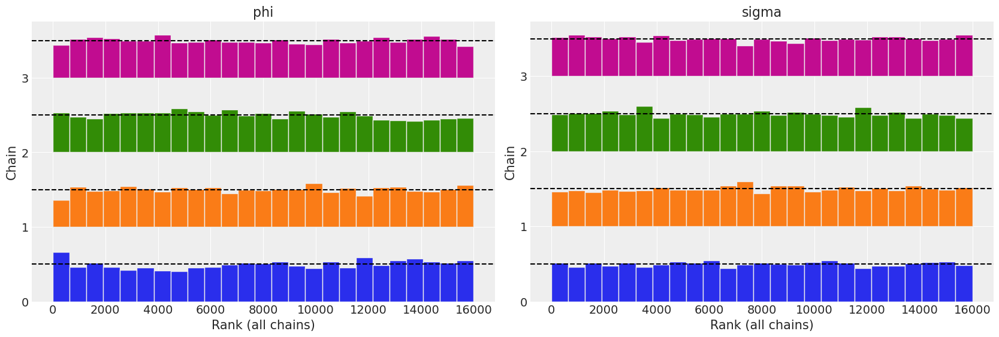

In [23]:
# Plot for specific variables (e.g., your 'phi' and 'sigma')
az.plot_rank(trace_bym, var_names=["phi", "sigma"])

/var/folders/j3/904q7dbj02j_jyjz7pvfgz384d40kw/T/ipykernel_82761/1902928995.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout() # Helps prevent label overlap


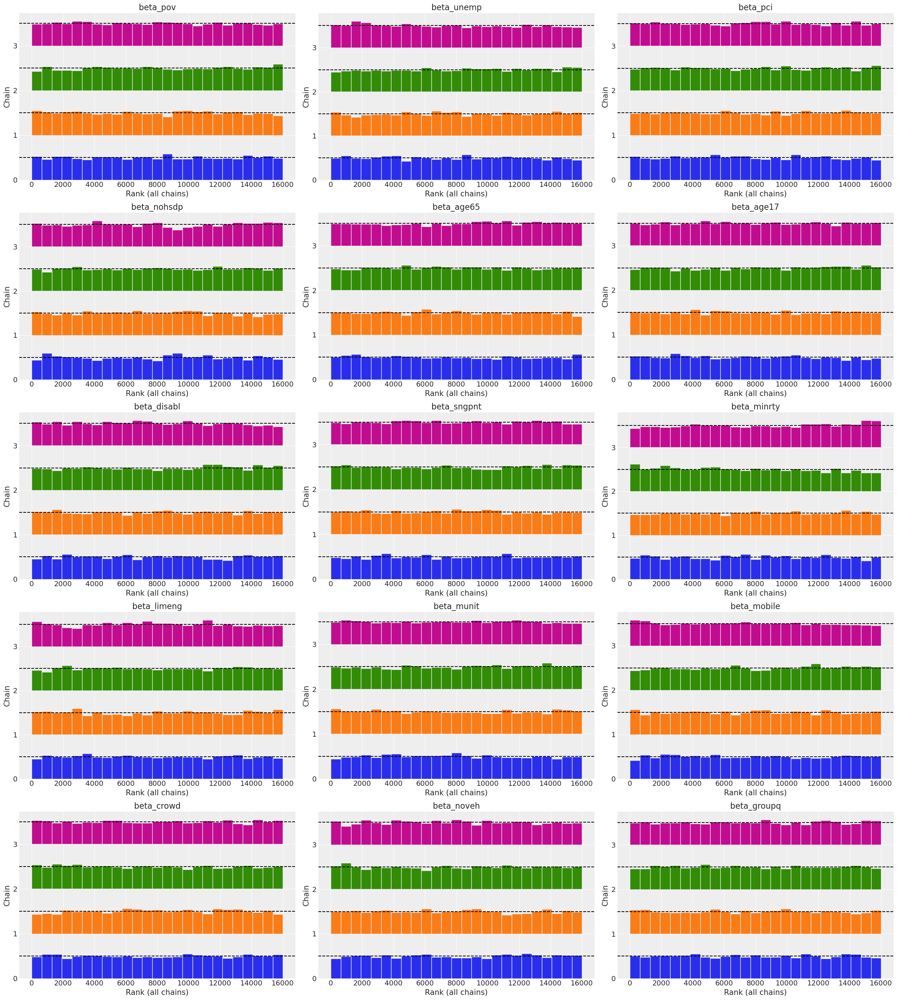

In [24]:
# plot rank plots for all coefficients
# Define coefficients to plot
coefficients = [
    "beta_pov", "beta_unemp", "beta_pci", "beta_nohsdp", 
    "beta_age65", "beta_age17", "beta_disabl", "beta_sngpnt", 
    "beta_minrty", "beta_limeng", "beta_munit", "beta_mobile", 
    "beta_crowd", "beta_noveh", "beta_groupq"
]

# Plot all of them at once in a single grid
az.plot_rank(trace_bym, var_names=coefficients)
plt.tight_layout() # Helps prevent label overlap

Checking Autocorrlation

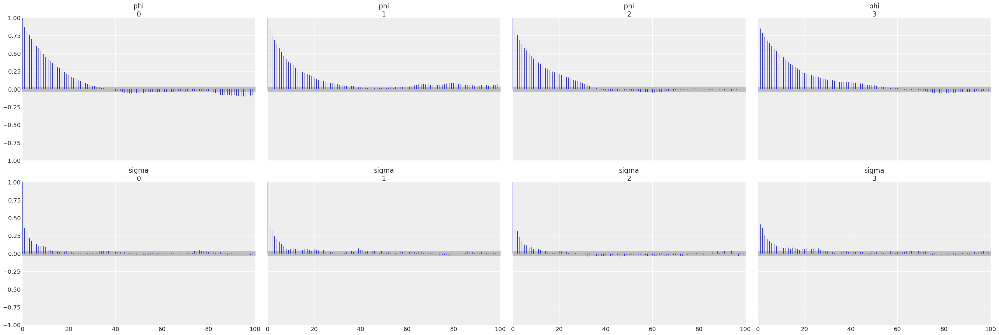

In [25]:
az.plot_autocorr(trace_bym, var_names=["phi","sigma"], max_lag=100) 
plt.show()

Monte Carlo Error

In [26]:
summary = az.summary(trace_bym, var_names=["phi", "sigma"])
print(summary[["mean", "sd", "ess_bulk","ess_tail", "mcse_mean"]])

# save summary to csv
result_dir = os.path.join(current_path, "results", state_abb_lower)
summary.to_csv(os.path.join(result_dir, "bym_summary.csv"))

        mean     sd  ess_bulk  ess_tail  mcse_mean
phi    0.709  0.245     740.0     753.0      0.009
sigma  0.552  0.080    2679.0    6627.0      0.002


In [27]:
# summry all the coefficients in a single dataframe
coefficients = [
    "beta_pov", "beta_unemp", "beta_pci", "beta_nohsdp", 
    "beta_age65", "beta_age17", "beta_disabl", "beta_sngpnt", 
    "beta_minrty", "beta_limeng", "beta_munit", "beta_mobile", 
    "beta_crowd", "beta_noveh", "beta_groupq"
]
coeff_summary = az.summary(trace_bym, var_names=coefficients)
print(coeff_summary)

              mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta_pov     0.310  0.833  -1.219    1.900      0.008    0.006   11817.0   
beta_unemp   0.228  0.779  -1.228    1.662      0.007    0.005   12807.0   
beta_pci    -0.865  0.893  -2.521    0.818      0.009    0.006   10364.0   
beta_nohsdp  0.451  0.796  -0.999    1.987      0.008    0.006   10460.0   
beta_age65  -1.139  0.902  -2.832    0.532      0.008    0.007   14178.0   
beta_age17  -0.004  0.767  -1.457    1.423      0.009    0.005    7778.0   
beta_disabl  0.740  0.721  -0.610    2.078      0.010    0.005    4726.0   
beta_sngpnt  0.493  0.912  -1.221    2.211      0.007    0.007   16283.0   
beta_minrty  0.676  0.489  -0.226    1.621      0.009    0.004    3119.0   
beta_limeng -0.034  0.868  -1.698    1.558      0.008    0.006   11745.0   
beta_munit   0.080  0.739  -1.265    1.493      0.008    0.005    7917.0   
beta_mobile -1.098  0.507  -2.034   -0.133      0.006    0.004    6733.0   
beta_crowd  

In [28]:
comparison_coeff_df = pd.DataFrame(index=coeff_summary.index)

# 2. Add the current model's means as a column
comparison_coeff_df['Model_BYM'] = coeff_summary['mean']

# Check the result
print(comparison_coeff_df.head())

             Model_BYM
beta_pov         0.310
beta_unemp       0.228
beta_pci        -0.865
beta_nohsdp      0.451
beta_age65      -1.139


Trace plots

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (23), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'intercept'}>,
        <Axes: title={'center': 'intercept'}>],
       [<Axes: title={'center': 'beta_pov'}>,
        <Axes: title={'center': 'beta_pov'}>],
       [<Axes: title={'center': 'beta_unemp'}>,
        <Axes: title={'center': 'beta_unemp'}>],
       [<Axes: title={'center': 'beta_pci'}>,
        <Axes: title={'center': 'beta_pci'}>],
       [<Axes: title={'center': 'beta_nohsdp'}>,
        <Axes: title={'center': 'beta_nohsdp'}>],
       [<Axes: title={'center': 'beta_age65'}>,
        <Axes: title={'center': 'beta_age65'}>],
       [<Axes: title={'center': 'beta_age17'}>,
        <Axes: title={'center': 'beta_age17'}>],
       [<Axes: title={'center': 'beta_disabl'}>,
        <Axes: title={'center': 'beta_disabl'}>],
       [<Axes: title={'center': 'beta_sngpnt'}>,
        <Axes: title={'center': 'beta_sngpnt'}>],
       [<Axes: title={'center': 'beta_minrty'}>,
        <Axes: title={'center': 'beta_minrty'}>],
       [<Axes: title={'center': 

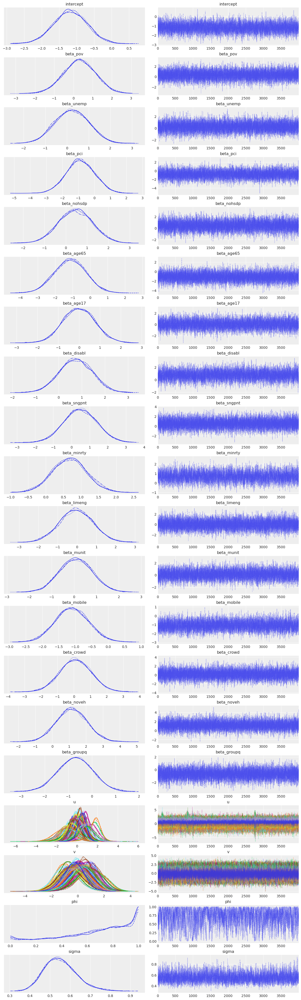

In [29]:
az.plot_trace(trace_bym)

Model metrics WAIC and LOO

In [30]:
loo_result_base = az.loo(trace_bym)
print(loo_result_base)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -303.93     9.78
p_loo       59.60        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)       74   66.7%
   (0.70, 1]   (bad)        35   31.5%
   (1, Inf)   (very bad)    2    1.8%



/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


In [31]:
waic_result_base = az.waic(trace_bym)
print(waic_result_base)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -288.26     8.31
p_waic       43.92        -

There has been a warning during the calculation. Please check the results.


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:1655: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Model results DIC

In [ ]:
# import stats

ModuleNotFoundError: No module named 'stats'

In [ ]:
# def calculate_dic(idata, obs_name="y_i", mu_name="mu"):
#     """
#     Manually calculates DIC for a PyMC model.
    
#     Parameters:
#     - idata: The InferenceData object (e.g., trace_bym)
#     - obs_name: Name of the observed variable in the model (default 'y_i')
#     - mu_name: Name of the deterministic mean variable (default 'mu')
#     """
    
#     # Check if log_likelihood is present
#     if not hasattr(idata, "log_likelihood"):
#         raise ValueError("Log-likelihood not found. Did you run pm.sample(..., idata_kwargs={'log_likelihood': True})?")

#     # 1. Calculate Mean Deviance (D_bar)
#     # D_bar = Mean( -2 * log_likelihood ) across all samples
#     log_lik = idata.log_likelihood[obs_name]
#     deviance_per_sample = -2 * log_lik.sum(dim="area_idx")
#     d_bar = deviance_per_sample.mean().item()

#     # 2. Calculate Deviance at the Mean (D_hat)
#     # D_hat = -2 * log_likelihood( y | mean(theta) )
    
#     # Get observed data y
#     y_obs = idata.observed_data[obs_name].values
    
#     # Get posterior mean of mu (averaging over chains and draws)
#     mu_mean = idata.posterior[mu_name].mean(dim=["chain", "draw"]).values
    
#     # Calculate log-likelihood manually using scipy to ensure correct constants (log y!)
#     # This corresponds to: y * log(mu) - mu - log(y!)
#     log_lik_at_mean = stats.poisson.logpmf(y_obs, mu_mean).sum()
#     d_hat = -2 * log_lik_at_mean

#     # 3. Calculate p_D (Effective number of parameters) and DIC
#     p_d = d_bar - d_hat
#     dic = d_hat + 2 * p_d
    
#     return {
#         "DIC": dic,
#         "p_D": p_d,
#         "d_bar": d_bar,
#         "d_hat": d_hat
#     }

In [ ]:
# # --- usage ---
# dic_results = calculate_dic(trace_bym, obs_name="y_i", mu_name="mu")

# print(f"DIC: {dic_results['DIC']:.2f}")
# print(f"p_D: {dic_results['p_D']:.2f}")A\

In [ ]:
# # Calculate
# results = get_dic(idata, obs_var_name="y_i", mu_var_name="mu")

# print(f"DIC:  {results['DIC']:.2f}")
# print(f"p_D:  {results['p_D']:.2f} (Effective number of parameters)")

####  II. Model with three parameters

In [33]:
# PyMC model for BYM
with pm.Model(coords=coords) as model_2:
    
   # Priors for intercept
   intercept = pm.Normal("intercept", mu=0, sigma=1)

   # Priors regression coefficients
   beta_pov = pm.Normal("beta_pov", mu=0, sigma=1)
   beta_unemp = pm.Normal("beta_unemp", mu=0, sigma=1)
   beta_pci = pm.Normal("beta_pci", mu=0, sigma=1)
   beta_nohsdp = pm.Normal("beta_nohsdp", mu=0, sigma=1)
   beta_age65 = pm.Normal("beta_age65", mu=0, sigma=1)
   beta_age17 = pm.Normal("beta_age17", mu=0, sigma=1)
   beta_disabl = pm.Normal("beta_disabl", mu=0, sigma=1)
   beta_sngpnt = pm.Normal("beta_sngpnt", mu=0, sigma=1)
   beta_minrty = pm.Normal("beta_minrty", mu=0, sigma=1)
   beta_limeng = pm.Normal("beta_limeng", mu=0, sigma=1)
   beta_munit = pm.Normal("beta_munit", mu=0, sigma=1)
   beta_mobile = pm.Normal("beta_mobile", mu=0, sigma=1)
   beta_crowd = pm.Normal("beta_crowd", mu=0, sigma=1)
   beta_noveh = pm.Normal("beta_noveh", mu=0, sigma=1)
   beta_groupq = pm.Normal("beta_groupq", mu=0, sigma=1)

   # Spatial structured effect (CAR)
   u = pm.ICAR("u", W=W, dims="area_idx")

   # Unstructured random effect (iid)/independent random effect
   v = pm.Normal("v", 0, 1, dims="area_idx")

   # TDA effect 
   s = pm.Data("AL_effect", AL, dims="area_idx") #using the standardized AL

   # joint variance of random effects(b) - Overall variability parameter (sigma acts as 1/sqrt(tau))
   sigma = pm.HalfNormal("sigma", 1)

    # ----- Dirichlet Mixing for the three random effects -----
    # alpha = [α1, α2, α3] where:
    #   α1: weight for the iid effect (theta)
    #   α2: weight for the spatial (ICAR) effect (phi)
    #   α3: weight for the TDA effect (AL_effect)
   alpha = pm.Dirichlet("alpha", a=np.array([1.0, 1.0, 1.0]))

   # Combine the three components
   mixture = pm.Deterministic(
        "mixture",
        pt.sqrt(alpha[0]) * v +
        pt.sqrt(alpha[1] / scaling_factor) * u +
        pt.sqrt(alpha[2]) * s,
        dims="area_idx"
    )

   # exponential link function to ensure
   # predictions are positive

   mu = pm.Deterministic(
      "mu", pt.exp(log_E + 
                  intercept +
                  beta_pov * EP_POV_AV_ORI + 
                  beta_unemp * EP_UNEMP_AV_ORI +
                  beta_pci * EP_PCI_AV_ORI +
                  beta_nohsdp * EP_NOHSDP_AV_ORI +
                  beta_age65 * EP_AGE65_AV_ORI +
                  beta_age17 * EP_AGE17_AV_ORI +
                  beta_disabl * EP_DISABL_AV_ORI +
                  beta_sngpnt * EP_SNGPNT_AV_ORI +
                  beta_minrty * EP_MINRTY_AV_ORI +
                  beta_limeng * EP_LIMENG_AV_ORI +
                  beta_munit * EP_MUNIT_AV_ORI +
                  beta_mobile * EP_MOBILE_AV_ORI +
                  beta_crowd * EP_CROWD_AV_ORI +
                  beta_noveh * EP_NOVEH_AV_ORI +
                  beta_groupq * EP_GROUPQ_AV_ORI +
                   sigma*mixture), dims="area_idx"
   )

   y_i = pm.Poisson("y_i", mu=mu, observed=y, dims="area_idx") # area_idx needed?
   rr = pm.Deterministic("rr", mu / pt.exp(log_E), dims="area_idx")

Sampling the data

In [34]:
with model_2:

    # # Sample from the model:
    trace_model_2 = pm.sample(draws=4000, tune=1500, chains=4, cores=4, target_accept=0.70, idata_kwargs ={"log_likelihood": True}, random_seed=42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, beta_pov, beta_unemp, beta_pci, beta_nohsdp, beta_age65, beta_age17, beta_disabl, beta_sngpnt, beta_minrty, beta_limeng, beta_munit, beta_mobile, beta_crowd, beta_noveh, beta_groupq, u, v, sigma, alpha]


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_500 tune and 4_000 draw iterations (6_000 + 16_000 draws total) took 299 seconds.


R hat statistics

In [35]:
# Calculate r_hat for sigma and phi
rhat_data_model_2 = az.rhat(trace_model_2, var_names=["alpha","sigma","beta_pov","beta_unemp","beta_pci","beta_nohsdp","beta_age65","beta_age17","beta_disabl","beta_sngpnt","beta_minrty","beta_limeng","beta_munit","beta_mobile","beta_crowd","beta_noveh","beta_groupq"])

# Print rhat values
print(f'R-hat for sigma: {rhat_data_model_2["sigma"].values}')  
print(f'R-hat for alpha: {rhat_data_model_2["alpha"].values}')

R-hat for sigma: 1.0012569876325808
R-hat for alpha: [1.00370485 1.00372271 1.0000474 ]


In [36]:
# Print rhat for all coefficients
for var in coefficients:
    print(f'R-hat for {var}: {rhat_data_model_2[var].values}')

R-hat for beta_pov: 0.9999536783565683
R-hat for beta_unemp: 1.0004006716689267
R-hat for beta_pci: 1.0004594125923387
R-hat for beta_nohsdp: 1.00069956313864
R-hat for beta_age65: 1.000323696980524
R-hat for beta_age17: 1.0002695696857622
R-hat for beta_disabl: 1.0004801695503867
R-hat for beta_sngpnt: 1.000149272792195
R-hat for beta_minrty: 1.00089661188759
R-hat for beta_limeng: 1.0002276991250914
R-hat for beta_munit: 1.000151169493915
R-hat for beta_mobile: 1.0002884810806785
R-hat for beta_crowd: 1.000155934799978
R-hat for beta_noveh: 1.000221758296921
R-hat for beta_groupq: 1.0001767302689257


Rank plots

array([<Axes: title={'center': 'sigma'}, xlabel='Rank (all chains)', ylabel='Chain'>,
       <Axes: title={'center': 'alpha\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>,
       <Axes: title={'center': 'alpha\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>,
       <Axes: title={'center': 'alpha\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
      dtype=object)

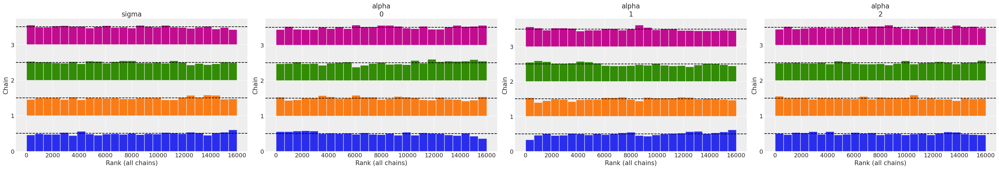

In [37]:
# Plot for specific variables (e.g., your 'phi' and 'sigma')
az.plot_rank(trace_model_2, var_names=["sigma","alpha"])

/var/folders/j3/904q7dbj02j_jyjz7pvfgz384d40kw/T/ipykernel_82761/1528089345.py:4: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


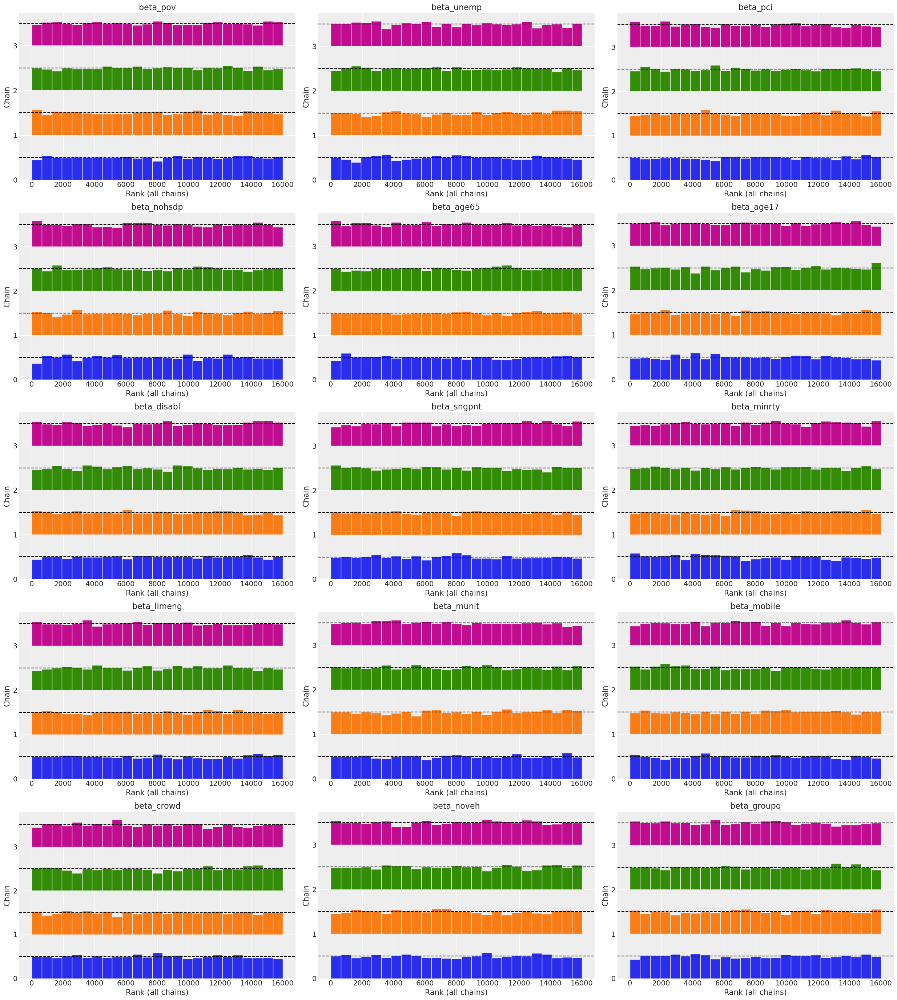

In [38]:
# plot rank plots for all coefficients

az.plot_rank(trace_model_2, var_names=coefficients)
plt.tight_layout()

Checking Autocorrlation

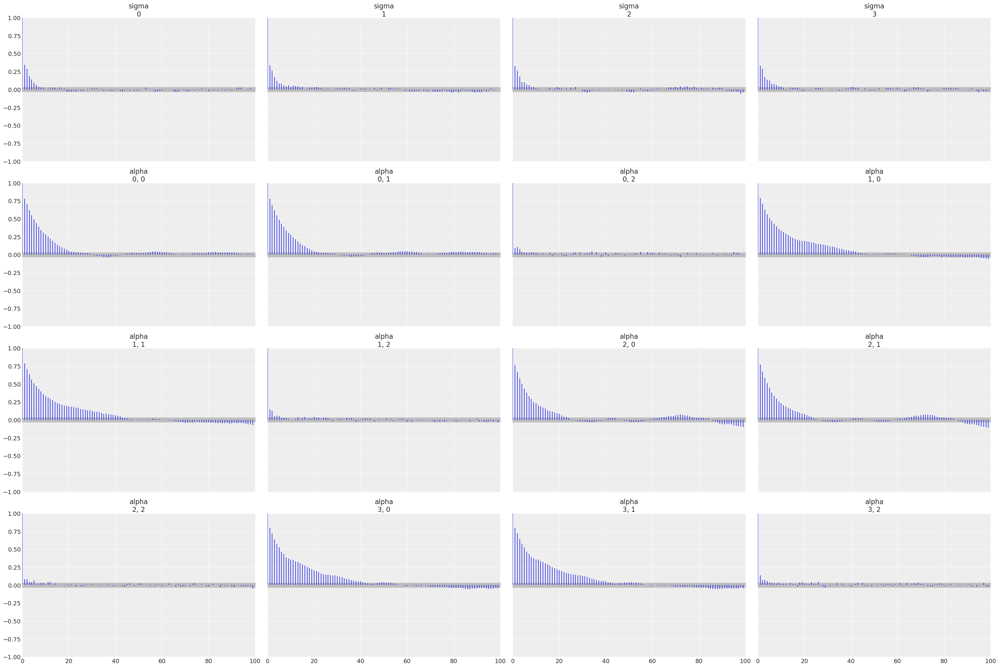

In [39]:
az.plot_autocorr(trace_model_2, var_names=["sigma", "alpha"], max_lag=100) 
plt.show()

Monte Carlo Error

In [40]:
summary_model_2 = az.summary(trace_model_2, var_names=["alpha", "sigma"])
print(summary_model_2[["mean", "sd", "ess_bulk","ess_tail", "mcse_mean"]])

           mean     sd  ess_bulk  ess_tail  mcse_mean
alpha[0]  0.361  0.209     861.0    1334.0      0.007
alpha[1]  0.584  0.219     851.0    1215.0      0.007
alpha[2]  0.055  0.045    7212.0    8629.0      0.001
sigma     0.550  0.074    4169.0    8446.0      0.001


In [41]:
# summry all the coefficients in a single dataframe
coeff_summary_model_2 = az.summary(trace_model_2, var_names=coefficients)
print(coeff_summary_model_2)

              mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta_pov     0.203  0.840  -1.318    1.844      0.008    0.006   10608.0   
beta_unemp   0.307  0.787  -1.179    1.790      0.008    0.006   10493.0   
beta_pci    -1.004  0.885  -2.667    0.635      0.009    0.006   10417.0   
beta_nohsdp  0.607  0.791  -0.960    2.025      0.008    0.006    9913.0   
beta_age65  -1.015  0.901  -2.739    0.636      0.008    0.007   12844.0   
beta_age17   0.042  0.771  -1.463    1.442      0.010    0.006    5826.0   
beta_disabl  0.887  0.726  -0.471    2.253      0.011    0.005    4534.0   
beta_sngpnt  0.495  0.920  -1.261    2.193      0.008    0.007   13095.0   
beta_minrty  0.421  0.504  -0.535    1.354      0.009    0.004    2871.0   
beta_limeng -0.308  0.878  -1.978    1.337      0.008    0.006   11600.0   
beta_munit  -0.027  0.738  -1.422    1.341      0.008    0.005    8408.0   
beta_mobile -1.068  0.503  -2.016   -0.141      0.006    0.004    6684.0   
beta_crowd  

In [42]:
# add the means to the comparison dataframe
comparison_coeff_df['Model_2'] = coeff_summary_model_2['mean']

# Check the result
print(comparison_coeff_df)

             Model_BYM  Model_2
beta_pov         0.310    0.203
beta_unemp       0.228    0.307
beta_pci        -0.865   -1.004
beta_nohsdp      0.451    0.607
beta_age65      -1.139   -1.015
beta_age17      -0.004    0.042
beta_disabl      0.740    0.887
beta_sngpnt      0.493    0.495
beta_minrty      0.676    0.421
beta_limeng     -0.034   -0.308
beta_munit       0.080   -0.027
beta_mobile     -1.098   -1.068
beta_crowd       0.104    0.078
beta_noveh       1.154    1.044
beta_groupq     -0.698   -0.731


Trace plots

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (23), generating only 20 plots
  warnings.warn(


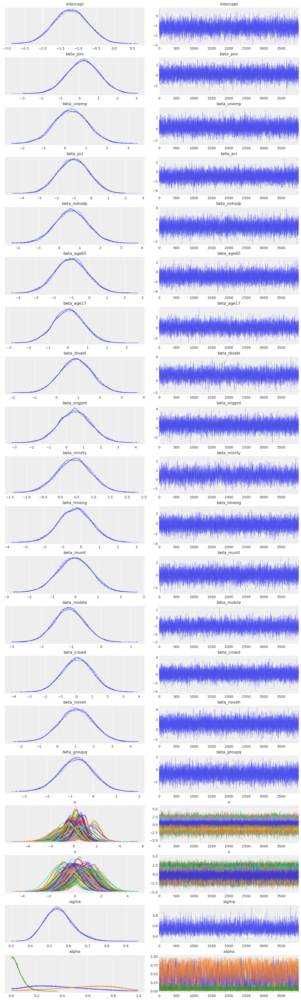

In [43]:
az.plot_trace(trace_model_2)
plt.show()

Traceplots - alpha

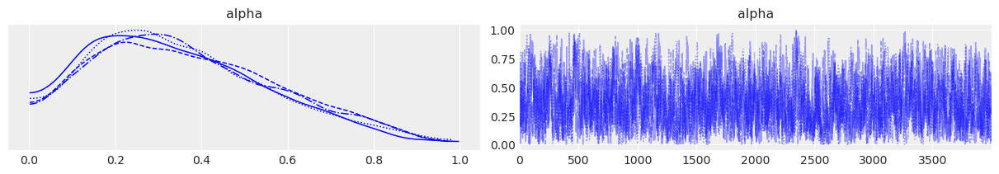

In [44]:
# Plot trace
axes = az.plot_trace(trace_model_2, var_names=["alpha"], coords={"alpha_dim_0": [0]})

# Change color manually
for ax in axes.ravel():
    for line in ax.get_lines():
        line.set_color("blue")  # or any color you like
plt.show()

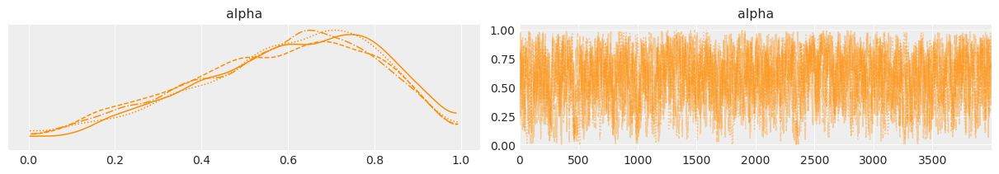

In [45]:
# Plot trace
axes = az.plot_trace(trace_model_2, var_names=["alpha"], coords={"alpha_dim_0": [1]})

# Change color manually
for ax in axes.ravel():
    for line in ax.get_lines():
        line.set_color("darkorange")  # or any color you like
plt.show()

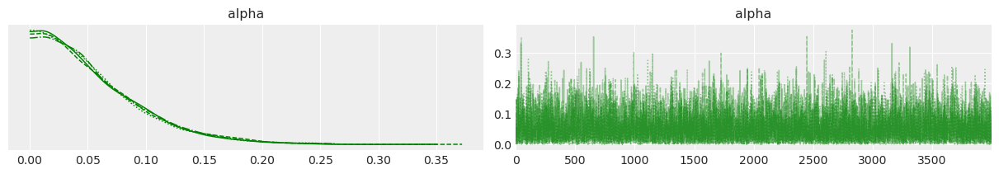

In [46]:
# Plot trace
axes = az.plot_trace(trace_model_2, var_names=["alpha"], coords={"alpha_dim_0": [2]})

# Change color manually
for ax in axes.ravel():
    for line in ax.get_lines():
        line.set_color("green")  # or any color you like
plt.show()

Model metrics

In [47]:
loo_result_trace_model_2 = az.loo(trace_model_2)
print(loo_result_trace_model_2)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -305.35    10.28
p_loo       61.95        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)       64   57.7%
   (0.70, 1]   (bad)        42   37.8%
   (1, Inf)   (very bad)    5    4.5%



/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


In [48]:
waic_result_trace_model_2 = az.waic(trace_model_2)
print(waic_result_trace_model_2)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -287.29     8.49
p_waic       43.89        -

There has been a warning during the calculation. Please check the results.


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:1655: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


####  III. Model with replaced unstructured component

In [49]:
# PyMC model for BYM
with pm.Model(coords=coords) as model_3:
    
   # Priors for intercept
   intercept = pm.Normal("intercept", mu=0, sigma=1)

   # Priors regression coefficients
   beta_pov = pm.Normal("beta_pov", mu=0, sigma=1)
   beta_unemp = pm.Normal("beta_unemp", mu=0, sigma=1)
   beta_pci = pm.Normal("beta_pci", mu=0, sigma=1)
   beta_nohsdp = pm.Normal("beta_nohsdp", mu=0, sigma=1)
   beta_age65 = pm.Normal("beta_age65", mu=0, sigma=1)
   beta_age17 = pm.Normal("beta_age17", mu=0, sigma=1)
   beta_disabl = pm.Normal("beta_disabl", mu=0, sigma=1)
   beta_sngpnt = pm.Normal("beta_sngpnt", mu=0, sigma=1)
   beta_minrty = pm.Normal("beta_minrty", mu=0, sigma=1)
   beta_limeng = pm.Normal("beta_limeng", mu=0, sigma=1)
   beta_munit = pm.Normal("beta_munit", mu=0, sigma=1)
   beta_mobile = pm.Normal("beta_mobile", mu=0, sigma=1)
   beta_crowd = pm.Normal("beta_crowd", mu=0, sigma=1)
   beta_noveh = pm.Normal("beta_noveh", mu=0, sigma=1)
   beta_groupq = pm.Normal("beta_groupq", mu=0, sigma=1)

   # Spatial structured effect (CAR)
   u = pm.ICAR("u", W=W, dims="area_idx")

   # Unstructured random effect (iid)/independent random effect
#    v = pm.Normal("v", 0, 1, dims="area_idx")

   # TDA effect 
   s = pm.Data("AL_effect", AL, dims="area_idx") #using the standardized AL

   # joint variance of random effects(b) - Overall variability parameter (sigma acts as 1/sqrt(tau))
   sigma = pm.HalfNormal("sigma", 1)

    # ----- Dirichlet Mixing for the three random effects -----
    # alpha = [α1, α2, α3] where:
    #   α1: weight for the iid effect (theta)
    #   α2: weight for the spatial (ICAR) effect (phi)
    #   α3: weight for the TDA effect (AL_effect)
#    alpha = pm.Dirichlet("alpha", a=np.array([1.0, 1.0, 1.0]))

# the mixing rate is phi
   phi = pm.Beta("phi", 0.5, 0.5)

#    # Combine the three components
#    mixture = pm.Deterministic(
#         "mixture",
#         pt.sqrt(alpha[0]) * v +
#         pt.sqrt(alpha[1] / scaling_factor) * u +
#         pt.sqrt(alpha[2]) * s,
#         dims="area_idx"
#     )
   
    # the bym component - it mixes a spatial and a random effect
   mixture = pm.Deterministic(
   "mixture", pt.sqrt(1 - phi) * s + pt.sqrt(phi / scaling_factor) * u, dims="area_idx"
   )


   # exponential link function to ensure
   # predictions are positive

   mu = pm.Deterministic(
      "mu", pt.exp(log_E + 
                  intercept +
                  beta_pov * EP_POV_AV_ORI + 
                  beta_unemp * EP_UNEMP_AV_ORI +
                  beta_pci * EP_PCI_AV_ORI +
                  beta_nohsdp * EP_NOHSDP_AV_ORI +
                  beta_age65 * EP_AGE65_AV_ORI +
                  beta_age17 * EP_AGE17_AV_ORI +
                  beta_disabl * EP_DISABL_AV_ORI +
                  beta_sngpnt * EP_SNGPNT_AV_ORI +
                  beta_minrty * EP_MINRTY_AV_ORI +
                  beta_limeng * EP_LIMENG_AV_ORI +
                  beta_munit * EP_MUNIT_AV_ORI +
                  beta_mobile * EP_MOBILE_AV_ORI +
                  beta_crowd * EP_CROWD_AV_ORI +
                  beta_noveh * EP_NOVEH_AV_ORI +
                  beta_groupq * EP_GROUPQ_AV_ORI +
                   sigma*mixture), dims="area_idx"
   )

   y_i = pm.Poisson("y_i", mu=mu, observed=y, dims="area_idx") # area_idx needed?
   rr = pm.Deterministic("rr", mu / pt.exp(log_E), dims="area_idx")

Sampling the data

In [50]:
with model_3:

    # # Sample from the model:
    trace_model_3 = pm.sample(draws=4000, tune=1500, chains=4, cores=4, target_accept=0.70, idata_kwargs ={"log_likelihood": True}, random_seed=42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, beta_pov, beta_unemp, beta_pci, beta_nohsdp, beta_age65, beta_age17, beta_disabl, beta_sngpnt, beta_minrty, beta_limeng, beta_munit, beta_mobile, beta_crowd, beta_noveh, beta_groupq, u, sigma, phi]


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_500 tune and 4_000 draw iterations (6_000 + 16_000 draws total) took 165 seconds.


R hat statistics

In [51]:
# Calculate r_hat for sigma and phi
rhat_data_model_3 = az.rhat(trace_model_3, var_names=["sigma","phi","beta_pov","beta_unemp","beta_pci","beta_nohsdp","beta_age65","beta_age17","beta_disabl","beta_sngpnt","beta_minrty","beta_limeng","beta_munit","beta_mobile","beta_crowd","beta_noveh","beta_groupq"])

# Print rhat values
print(f'R-hat for sigma: {rhat_data_model_3["sigma"].values}')  
print(f'R-hat for phi: {rhat_data_model_3["phi"].values}')

R-hat for sigma: 1.001605576224922
R-hat for phi: 1.0002611654972253


In [52]:
# print rhat for all coefficients
for var in coefficients:
    print(f'R-hat for {var}: {rhat_data_model_3[var].values}')

R-hat for beta_pov: 0.9999351230804648
R-hat for beta_unemp: 1.0000192516069473
R-hat for beta_pci: 1.0000959975944763
R-hat for beta_nohsdp: 0.9999723676734108
R-hat for beta_age65: 1.000243583073456
R-hat for beta_age17: 1.0000965897151433
R-hat for beta_disabl: 1.0003281277146574
R-hat for beta_sngpnt: 1.0000049650989535
R-hat for beta_minrty: 1.0003951021447999
R-hat for beta_limeng: 0.9999388467392692
R-hat for beta_munit: 1.000112128766939
R-hat for beta_mobile: 1.0001966892196201
R-hat for beta_crowd: 1.0002394659689038
R-hat for beta_noveh: 1.0004585314840315
R-hat for beta_groupq: 1.0000277787546008


Rank plots

array([<Axes: title={'center': 'phi'}, xlabel='Rank (all chains)', ylabel='Chain'>,
       <Axes: title={'center': 'sigma'}, xlabel='Rank (all chains)', ylabel='Chain'>],
      dtype=object)

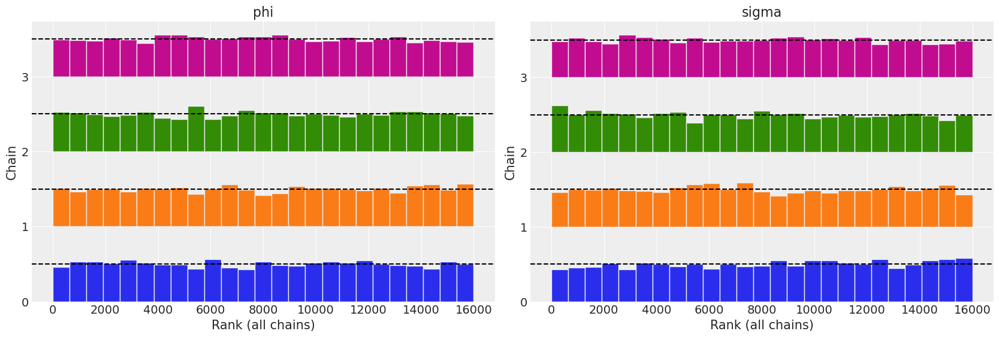

In [53]:
# Plot for specific variables (e.g., your 'phi' and 'sigma')
az.plot_rank(trace_model_3, var_names=["phi", "sigma"])

/var/folders/j3/904q7dbj02j_jyjz7pvfgz384d40kw/T/ipykernel_82761/378605055.py:4: UserWarning: The figure layout has changed to tight
  plt.tight_layout() # Helps prevent label overlap


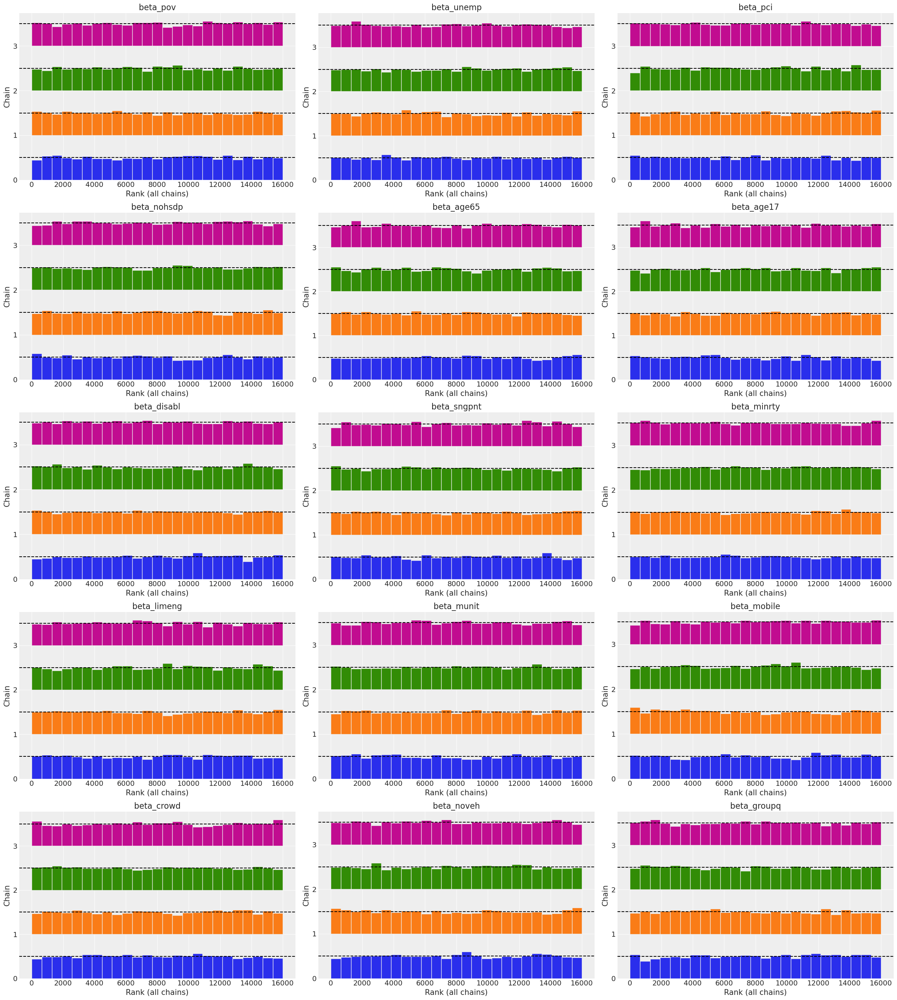

In [54]:
# plot rank plots for all coefficients

az.plot_rank(trace_model_3, var_names=coefficients)
plt.tight_layout() # Helps prevent label overlap

Checking Autocorrlation

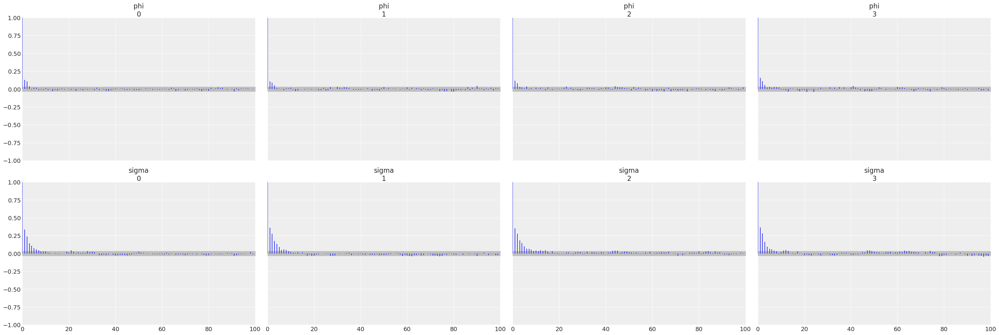

In [55]:
az.plot_autocorr(trace_model_3, var_names=["phi","sigma"], max_lag=100) 
plt.show()

Monte Carlo Error

In [56]:
summary_model_3 = az.summary(trace_model_3, var_names=["phi", "sigma"])
print(summary_model_3[["mean", "sd", "ess_bulk", "mcse_mean"]])

        mean     sd  ess_bulk  mcse_mean
phi    0.977  0.026    7997.0      0.000
sigma  0.607  0.086    4332.0      0.001


In [57]:
# summry all the coefficients in a single dataframe
coeff_summary_model_3 = az.summary(trace_model_3, var_names=coefficients)
print(coeff_summary_model_3)

              mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta_pov     0.233  0.828  -1.368    1.729      0.006    0.006   16684.0   
beta_unemp   0.282  0.779  -1.158    1.762      0.006    0.005   16427.0   
beta_pci    -0.891  0.886  -2.514    0.803      0.008    0.006   13389.0   
beta_nohsdp  0.609  0.794  -0.861    2.103      0.006    0.006   15958.0   
beta_age65  -1.020  0.896  -2.757    0.596      0.006    0.007   19254.0   
beta_age17  -0.196  0.742  -1.663    1.120      0.006    0.005   13910.0   
beta_disabl  1.060  0.706  -0.282    2.369      0.008    0.005    7930.0   
beta_sngpnt  0.453  0.915  -1.289    2.125      0.006    0.007   22423.0   
beta_minrty  0.407  0.504  -0.531    1.378      0.009    0.004    3464.0   
beta_limeng -0.264  0.880  -1.905    1.415      0.007    0.006   15830.0   
beta_munit   0.045  0.731  -1.301    1.453      0.006    0.005   13943.0   
beta_mobile -1.095  0.502  -2.025   -0.138      0.005    0.003    9118.0   
beta_crowd  

In [58]:
# add the means to the comparison dataframe
comparison_coeff_df['Model_3'] = coeff_summary_model_3['mean']

# Check the result
print(comparison_coeff_df)

             Model_BYM  Model_2  Model_3
beta_pov         0.310    0.203    0.233
beta_unemp       0.228    0.307    0.282
beta_pci        -0.865   -1.004   -0.891
beta_nohsdp      0.451    0.607    0.609
beta_age65      -1.139   -1.015   -1.020
beta_age17      -0.004    0.042   -0.196
beta_disabl      0.740    0.887    1.060
beta_sngpnt      0.493    0.495    0.453
beta_minrty      0.676    0.421    0.407
beta_limeng     -0.034   -0.308   -0.264
beta_munit       0.080   -0.027    0.045
beta_mobile     -1.098   -1.068   -1.095
beta_crowd       0.104    0.078    0.014
beta_noveh       1.154    1.044    1.201
beta_groupq     -0.698   -0.731   -0.759


Trace plots

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (22), generating only 20 plots
  warnings.warn(


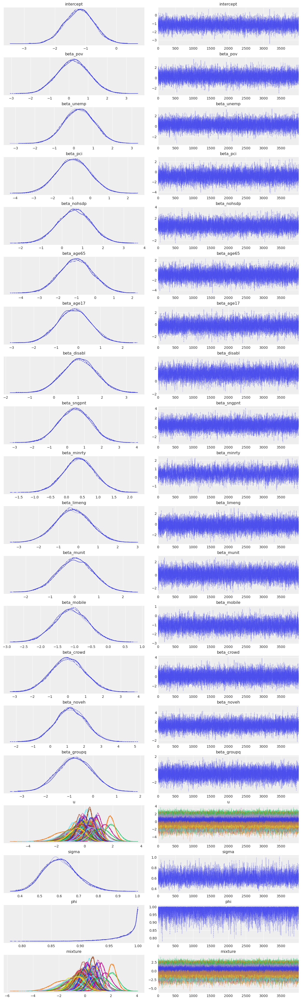

In [59]:
az.plot_trace(trace_model_3)
plt.show()

/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (22), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'intercept'}>,
        <Axes: title={'center': 'intercept'}>],
       [<Axes: title={'center': 'beta_pov'}>,
        <Axes: title={'center': 'beta_pov'}>],
       [<Axes: title={'center': 'beta_unemp'}>,
        <Axes: title={'center': 'beta_unemp'}>],
       [<Axes: title={'center': 'beta_pci'}>,
        <Axes: title={'center': 'beta_pci'}>],
       [<Axes: title={'center': 'beta_nohsdp'}>,
        <Axes: title={'center': 'beta_nohsdp'}>],
       [<Axes: title={'center': 'beta_age65'}>,
        <Axes: title={'center': 'beta_age65'}>],
       [<Axes: title={'center': 'beta_age17'}>,
        <Axes: title={'center': 'beta_age17'}>],
       [<Axes: title={'center': 'beta_disabl'}>,
        <Axes: title={'center': 'beta_disabl'}>],
       [<Axes: title={'center': 'beta_sngpnt'}>,
        <Axes: title={'center': 'beta_sngpnt'}>],
       [<Axes: title={'center': 'beta_minrty'}>,
        <Axes: title={'center': 'beta_minrty'}>],
       [<Axes: title={'center': 

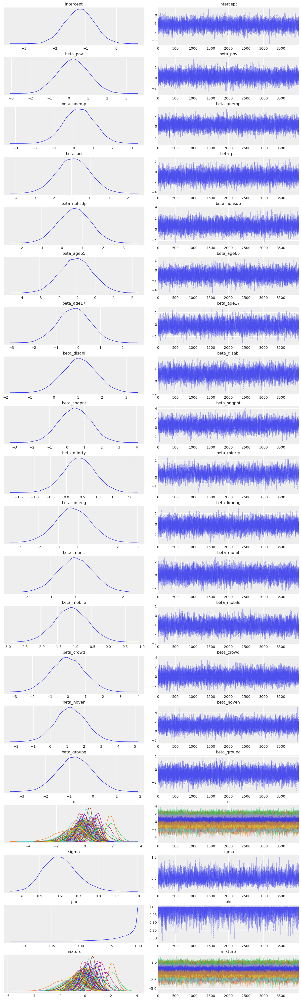

In [60]:
az.plot_trace(trace_model_3, combined=True)

In [61]:
az.summary(trace_model_3, var_names=["sigma","phi"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.607,0.086,0.452,0.773,0.001,0.001,4332.0,7383.0,1.0
phi,0.977,0.026,0.928,1.000,0.000,0.000,7997.0,7202.0,1.0


Model metrics WAIC and LOO

In [62]:
loo_result_model_3 = az.loo(trace_model_3)
print(loo_result_model_3)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -306.16    10.42
p_loo       59.01        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)       74   66.7%
   (0.70, 1]   (bad)        37   33.3%
   (1, Inf)   (very bad)    0    0.0%



/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


In [63]:
waic_result_model_3 = az.waic(trace_model_3)
print(waic_result_model_3)

Computed from 16000 posterior samples and 111 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -291.16     9.10
p_waic       44.01        -

There has been a warning during the calculation. Please check the results.


/Users/h6x/anaconda3/envs/pymc_env2/lib/python3.12/site-packages/arviz/stats/stats.py:1655: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Model results DIC

##### Compare model results

LOO

In [64]:
df_comp_loo = az.compare({"bym": loo_result_base,"model_2": loo_result_trace_model_2, "model_3": loo_result_model_3}, ic="loo")
print(df_comp_loo)

         rank    elpd_loo      p_loo  elpd_diff        weight         se  \
bym         0 -303.929949  59.595201   0.000000  9.722972e-01   9.781477   
model_2     1 -305.349055  61.948971   1.419106  1.613706e-16  10.278012   
model_3     2 -306.157249  59.008575   2.227300  2.770278e-02  10.419164   

              dse  warning scale  
bym      0.000000     True   log  
model_2  1.491302     True   log  
model_3  2.300066     True   log  


WAIC

In [65]:
df_comp_waic = az.compare({"bym": waic_result_base,"model_2": waic_result_trace_model_2, "model_3": waic_result_model_3}, ic="waic")
print(df_comp_waic)

         rank   elpd_waic     p_waic  elpd_diff        weight        se  \
model_2     0 -287.288663  43.888579   0.000000  1.000000e+00  8.488821   
bym         1 -288.256812  43.922064   0.968150  0.000000e+00  8.308328   
model_3     2 -291.160233  44.011559   3.871571  1.443290e-15  9.103910   

              dse  warning scale  
model_2  0.000000     True   log  
bym      1.022425     True   log  
model_3  1.795447     True   log  


Get sample values to plot the map

In [66]:
rr_bym = trace_bym.posterior["rr"].mean(dim=["chain", "draw"]).values
rr_model_2 = trace_model_2.posterior["rr"].mean(dim=["chain", "draw"]).values
rr_model_3 = trace_model_3.posterior["rr"].mean(dim=["chain", "draw"]).values

In [67]:
rr_bym

array([0.23374634, 0.31991197, 0.40208679, 0.663677  , 0.30558194,
       0.53309824, 0.49352535, 0.23158921, 0.35201821, 0.21937675,
       0.27688352, 0.39802218, 0.35882832, 0.70149887, 0.22796841,
       0.50243223, 0.35990587, 0.32915182, 0.36927911, 0.33097509,
       0.48360749, 0.23034569, 0.36192895, 0.38088991, 0.58330131,
       0.46192597, 0.26199588, 0.2725236 , 0.38071812, 0.6282281 ,
       0.35727045, 0.49769751, 0.21929432, 1.37125799, 0.36019183,
       0.35789227, 0.73077993, 0.3427159 , 0.55088005, 0.3778081 ,
       0.55956032, 0.28080943, 0.24004305, 0.47544654, 0.3091363 ,
       0.25261094, 0.26401727, 0.58740807, 0.89785504, 0.35868904,
       0.25851574, 0.29982195, 0.27640493, 0.22734897, 0.43827063,
       0.59777466, 0.82945542, 1.59641172, 0.23947305, 1.09465326,
       0.73427408, 0.34501912, 0.62157951, 0.28918258, 1.18353639,
       0.25230826, 0.36073348, 0.18897145, 2.09399318, 0.23359798,
       0.44617301, 2.25509992, 0.45165437, 0.68809036, 0.59322

In [68]:
combined_data["rr_bym"] = rr_bym
combined_data["rr_model_2"] = rr_model_3
combined_data["rr_model_3"] = rr_model_3


In [69]:
# lets get the differences to base rr_bym
combined_data["rr_diff_bym_model_2"] = combined_data["rr_model_2"] - combined_data["rr_bym"]
combined_data["rr_diff_bym_model_3"] = combined_data["rr_model_3"] - combined_data["rr_bym"]


In [70]:
combined_data.head()

,FIPS,observed_deaths,expected_deaths,SMR,EP_POV_TL,EP_POV_AL,EP_POV_TML,EP_POV_AML,EP_POV_AV_ORI,EP_UNEMP_TL,...,geometry,AL,TL,AML,TML,rr_bym,rr_model_2,rr_model_3,rr_diff_bym_model_2,rr_diff_bym_model_3
0,51095,3.0,23.932932,0.125350,2.234358,0.203123,1.117179,0.101562,0.089559,1.974441,...,"MULTIPOLYGON (((-76.91423 37.35679, -76.91214 ...",0.692487,-0.158943,0.692487,-0.158943,0.233746,0.262091,0.262091,0.028345,0.028345
1,51167,2.0,10.000000,0.218327,0.635207,0.090744,0.317603,0.045372,0.212998,1.035144,...,"MULTIPOLYGON (((-82.40224 36.87794, -82.39904 ...",-0.530218,-0.279974,-0.530218,-0.279974,0.319912,0.352864,0.352864,0.032952,0.032952
2,51173,4.0,10.317812,0.387679,0.880170,0.097797,0.440085,0.048898,0.206551,1.073482,...,"MULTIPOLYGON (((-81.8371 36.92904, -81.8341 36...",-0.369572,-0.256052,-0.369572,-0.256052,0.402087,0.405951,0.405951,0.003865,0.003865
3,51540,12.0,16.744795,0.716641,5.931071,0.494256,2.965536,0.247128,0.255391,1.738019,...,"MULTIPOLYGON (((-78.52338 38.02338, -78.52303 ...",0.465439,-0.162404,0.465439,-0.162404,0.663677,0.649848,0.649848,-0.013829,-0.013829
4,51031,5.0,18.523351,0.269930,2.150583,0.179215,1.075292,0.089608,0.132909,1.143770,...,"MULTIPOLYGON (((-79.44286 37.05587, -79.39946 ...",-0.214244,-0.218942,-0.214244,-0.218942,0.305582,0.308788,0.308788,0.003206,0.003206


In [73]:
# let's add missing islands and overdose missing areas back with NaN values
geo_data_for_the_area = geo_data[geo_data['ST_ABBR']==state_abb]

# merge combined_data with geo_data_for_the_area to get all FIPS codes (with NULL values for missing areas)
combined_data_full = geo_data_for_the_area.merge(combined_data, on="FIPS", how="left")

# make combined data into a geodataframe
combined_data_full = gpd.GeoDataFrame(combined_data_full, geometry='geometry_x')

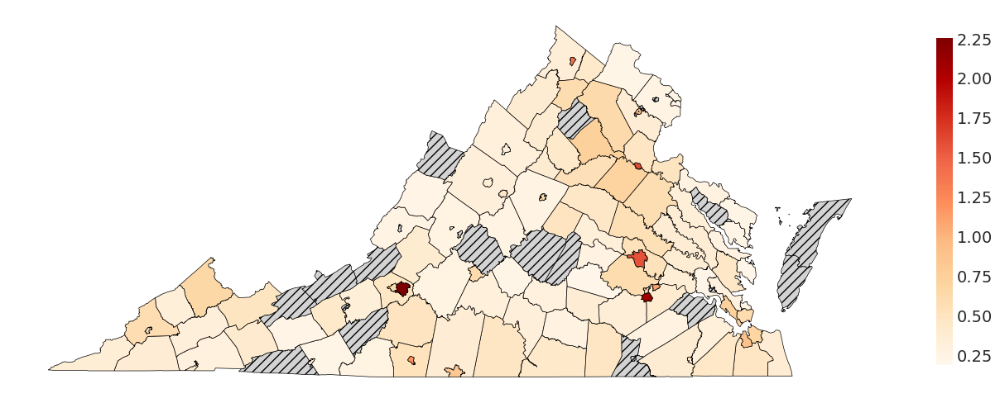

In [74]:
# plot a map with the relative risk for the BYM model
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

combined_data_full.plot(
    column="rr_bym", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"bym_relative_risk_map.png"), bbox_inches='tight', dpi=300)

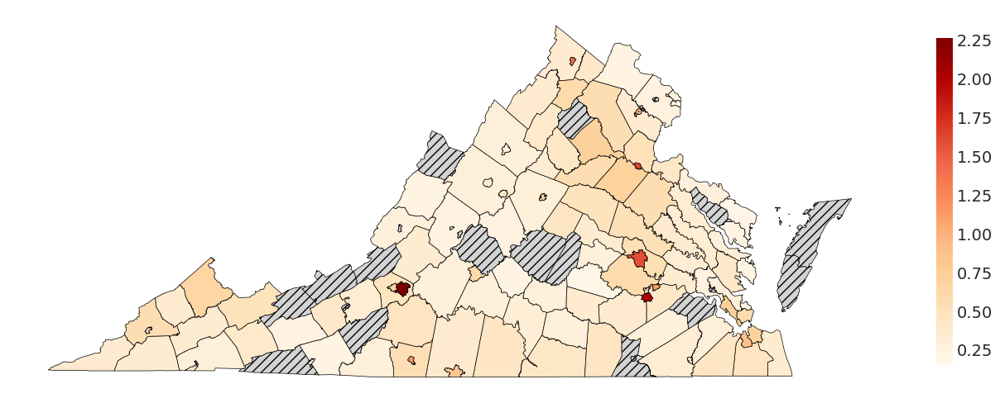

In [75]:
# plot a map with the relative risk for the model 2
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

combined_data_full.plot(
    column="rr_model_2", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"bymt_relative_risk_map.png"), bbox_inches='tight', dpi=300)

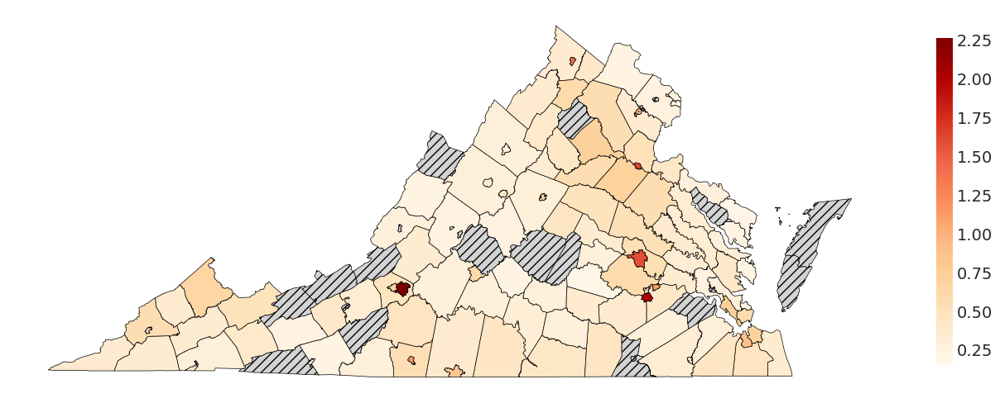

In [76]:
# plot a map with the relative risk for the model 2
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

combined_data_full.plot(
    column="rr_model_3", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"bymt_relative_risk_map.png"), bbox_inches='tight', dpi=300)

Plot the differences

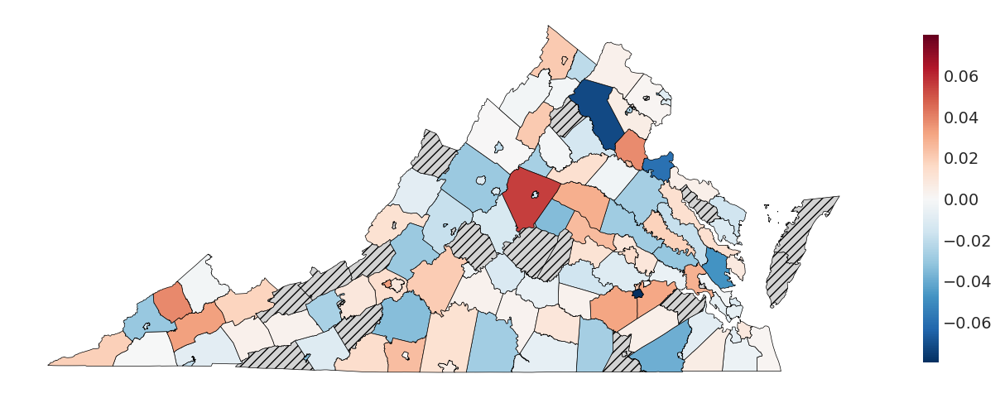

In [77]:
# plot a map with the relative risk for the BYM-T and the BYM model
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

# Find min/max of your column
vmin = combined_data_full["rr_diff_bym_model_2"].min()
vmax = combined_data_full["rr_diff_bym_model_2"].max()

# Create symmetric range around 0
abs_max = max(abs(vmin), abs(vmax))

combined_data_full.plot(
    column="rr_diff_bym_model_2", 
    ax=ax, 
    legend=True, 
    cmap="RdBu_r", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    vmin=-abs_max,  # ensure 0 is at center
    vmax=abs_max,
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"rr_diff_bymt.png"), bbox_inches='tight', dpi=300)

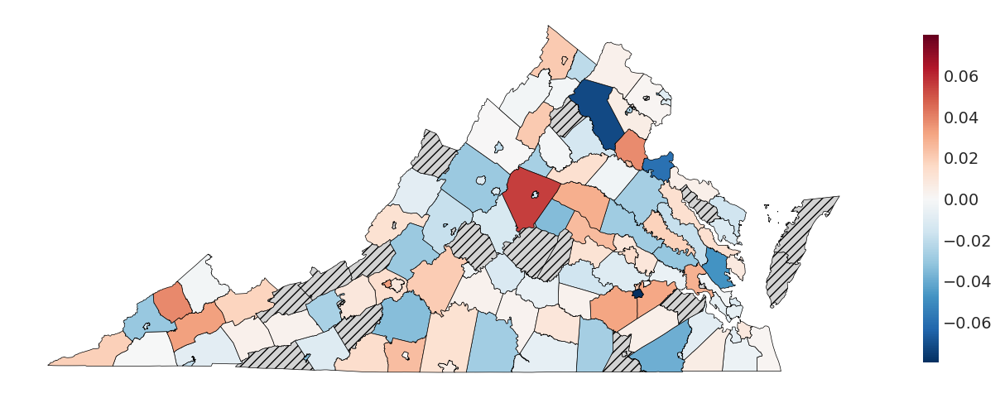

In [78]:
# plot a map with the relative risk for the BYM-T and the BYM model
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white

# Find min/max of your column
vmin = combined_data_full["rr_diff_bym_model_3"].min()
vmax = combined_data_full["rr_diff_bym_model_3"].max()

# Create symmetric range around 0
abs_max = max(abs(vmin), abs(vmax))

combined_data_full.plot(
    column="rr_diff_bym_model_3", 
    ax=ax, 
    legend=True, 
    cmap="RdBu_r", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    vmin=-abs_max,  # ensure 0 is at center
    vmax=abs_max,
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"rr_diff_bymt.png"), bbox_inches='tight', dpi=300)

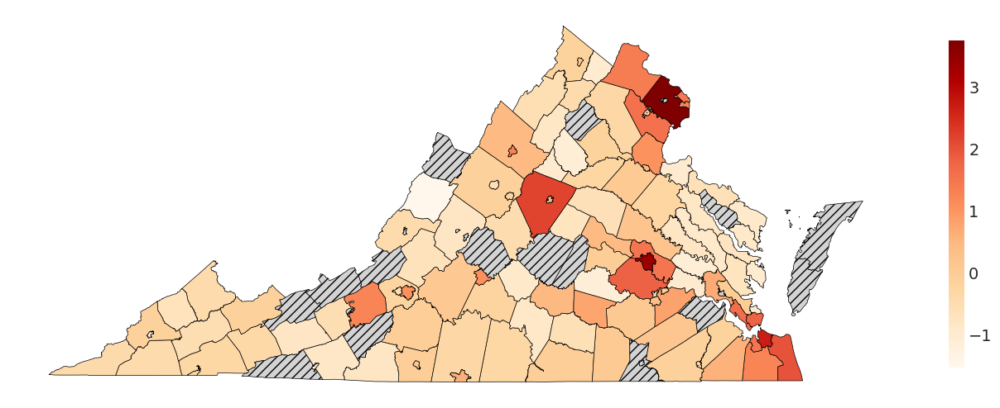

In [79]:
# plot a map with AL values for each area
fig, ax = plt.subplots(1, 1, figsize=(12, 8), facecolor='white')  # set figure background to white
ax.set_facecolor("white")  # set axes background to white


combined_data_full.plot(
    column="AL", 
    ax=ax, 
    legend=True, 
    cmap="OrRd", 
    edgecolor="black", 
    linewidth=0.5,
    legend_kwds={"shrink": 0.5},  # Makes the legend smaller
    # Style for NaN values:
    missing_kwds={
        "color": "lightgrey",       # fill color for NaN
        "edgecolor": "black",       # edge color for NaN polygons
        "hatch": "///",             # add hatching for NaN
        "label": "No Data"          # adds entry in legend
    }
)   
# Remove axis ticks for a cleaner map visualization
ax.set_xticks([])
ax.set_yticks([])   

# Show the plot
plt.savefig(os.path.join( current_path, "results",state_abb_lower ,"AL_map.png"), bbox_inches='tight', dpi=300)

/var/folders/j3/904q7dbj02j_jyjz7pvfgz384d40kw/T/ipykernel_82761/2052115375.py:4: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


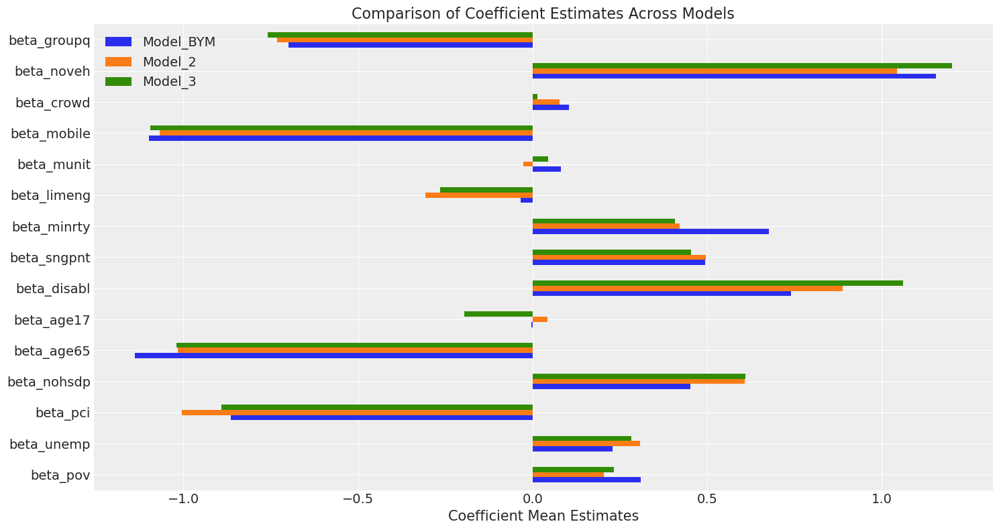

In [80]:
comparison_coeff_df.plot(kind='barh', figsize=(15, 8))
plt.xlabel('Coefficient Mean Estimates')
plt.title('Comparison of Coefficient Estimates Across Models')
plt.tight_layout()
plt.show()

Comparison of sigma, phi, alpha

In [81]:
# bym model sigma and phi model diagnostics
print(summary[["mean", "sd", "ess_bulk","ess_tail", "mcse_mean"]])

        mean     sd  ess_bulk  ess_tail  mcse_mean
phi    0.709  0.245     740.0     753.0      0.009
sigma  0.552  0.080    2679.0    6627.0      0.002


In [82]:
# model 2 sigma and alpha model diagnostics
print(summary_model_2[["mean", "sd", "ess_bulk","ess_tail", "mcse_mean"]])

           mean     sd  ess_bulk  ess_tail  mcse_mean
alpha[0]  0.361  0.209     861.0    1334.0      0.007
alpha[1]  0.584  0.219     851.0    1215.0      0.007
alpha[2]  0.055  0.045    7212.0    8629.0      0.001
sigma     0.550  0.074    4169.0    8446.0      0.001


In [83]:
# model 3 sigma and phi model diagnostics
print(summary_model_3[["mean", "sd", "ess_bulk","ess_tail", "mcse_mean"]])

        mean     sd  ess_bulk  ess_tail  mcse_mean
phi    0.977  0.026    7997.0    7202.0      0.000
sigma  0.607  0.086    4332.0    7383.0      0.001
